# Dota 2 Observers and Sentry Wards Data Exploration

## Observer Wards
- are purchasable, stackable consumables
- invisible watcher that gives **ground vision** (obstructed vision) in a 1600 radius to your team. Lasts 6 minutes.

https://dota2.fandom.com/wiki/Observer_Ward

## Sentry Wards
- are purchasable, stackable consumables
- invisible watcher that grants **True Sight** (detects invisibility), the ability to see invisible enemy units and wards, to any existing allied vision within a radius.
- Does not grant ground vision

https://dota2.fandom.com/wiki/Sentry_Ward

In [1]:
""" {
    "obs_log": [
        {
            "time": -42,
            "type": "obs_log",
            "slot": 0,
            "x": 179.3,
            "y": 100.8,
            "z": 129,
            "entityleft": false,
            "ehandle": 7307646,
            "key": "[179,101]",
            "player_slot": 0
        }
    ],
    "sen_log": [
        {
            "time": -28,
            "type": "sen_log",
            "slot": 0,
            "x": 162,
            "y": 99.9,
            "z": 129,
            "entityleft": false,
            "ehandle": 13795721,
            "key": "[162,100]",
            "player_slot": 0
        }
    ]
} """

' {\n    "obs_log": [\n        {\n            "time": -42,\n            "type": "obs_log",\n            "slot": 0,\n            "x": 179.3,\n            "y": 100.8,\n            "z": 129,\n            "entityleft": false,\n            "ehandle": 7307646,\n            "key": "[179,101]",\n            "player_slot": 0\n        }\n    ],\n    "sen_log": [\n        {\n            "time": -28,\n            "type": "sen_log",\n            "slot": 0,\n            "x": 162,\n            "y": 99.9,\n            "z": 129,\n            "entityleft": false,\n            "ehandle": 13795721,\n            "key": "[162,100]",\n            "player_slot": 0\n        }\n    ]\n} '

In [ ]:
from tqdm import tqdm
import glob
import os
import json
from pprint import pprint
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

from game_data_collector.api import Role, get_hero_ids_of_role

# 20006/20006 [01:46<00:00, 187.85it/s]

coords_li = []
json_files = list(glob.iglob(os.path.join("..", "resources", "data", "*.json")))

for j in tqdm(json_files):
    with open(j, "r", encoding="utf-8") as fi:
        match = json.load(fi)

        for player in match["players"]:
            for obs in player["obs_log"]:
                coords_li.append({"match_id": match["match_id"], "hero_id": player["hero_id"], "rank_tier": player["rank_tier"], "time": obs["time"], "type": obs["type"], "x": obs["x"], "y": obs["y"]})
            for obs in player["sen_log"]:
                coords_li.append({"match_id": match["match_id"], "hero_id": player["hero_id"], "rank_tier": player["rank_tier"], "time": obs["time"], "type": obs["type"], "x": obs["x"], "y": obs["y"]})
                                
coords = pd.DataFrame(coords_li)

100%|██████████| 20006/20006 [01:46<00:00, 187.85it/s]


In [3]:
coords.dropna(inplace=True)
coords["rank_group"] = (coords["rank_tier"] // 10).astype(int).astype("category")
print(coords.head())


     match_id  hero_id  rank_tier  time     type      x      y rank_group
0  7861499456       64       55.0   -42  obs_log  179.3  100.8          5
1  7861499456       64       55.0   430  obs_log  188.2  115.9          5
2  7861499456       64       55.0   713  obs_log   82.3  174.6          5
3  7861499456       64       55.0   862  obs_log  115.6  182.3          5
4  7861499456       64       55.0   913  obs_log  124.0  131.6          5


### Observer Wards

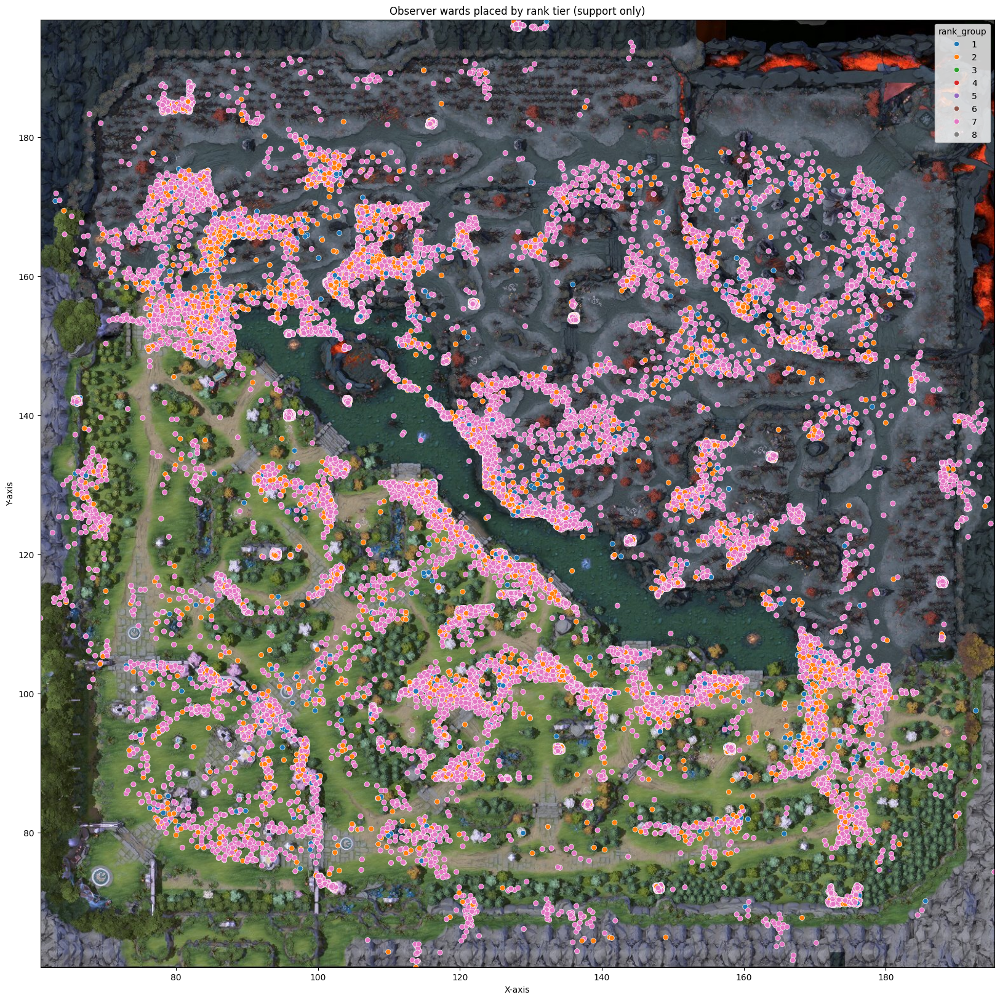

In [9]:
# filter data
support_hero_ids = get_hero_ids_of_role(Role.SUPPORT)

# only consider higher rank supports
coords_obs_support = coords[(coords["hero_id"].isin(support_hero_ids)) & (coords["rank_group"].isin([1, 2, 7])) & (coords["type"] == "obs_log")]
# coords_8 = coords[coords["rank_group"] == 8]

# create map scatter
dota_map = Image.open(os.path.join("..", "resources", "dota_map.jpg"))

fig, ax = plt.subplots(figsize=(20, 20))

# Image credits: https://washingtondccitymapminecraft.github.io/new-zprcp-the-battleground-of-legends-a-comprehensive-guide-to-the-dota-2-map-rmilp-pics/
ax.imshow(dota_map, extent=[min(coords_obs_support['x']), max(coords_obs_support['x']), min(coords_obs_support['y']), max(coords_obs_support['y'])], aspect='auto')

sns.scatterplot(x='x', y='y', hue='rank_group', data=coords_obs_support, ax=ax)

ax.set_title('Observer wards placed by rank tier (support only)')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

plt.show()

### Sentry Wards

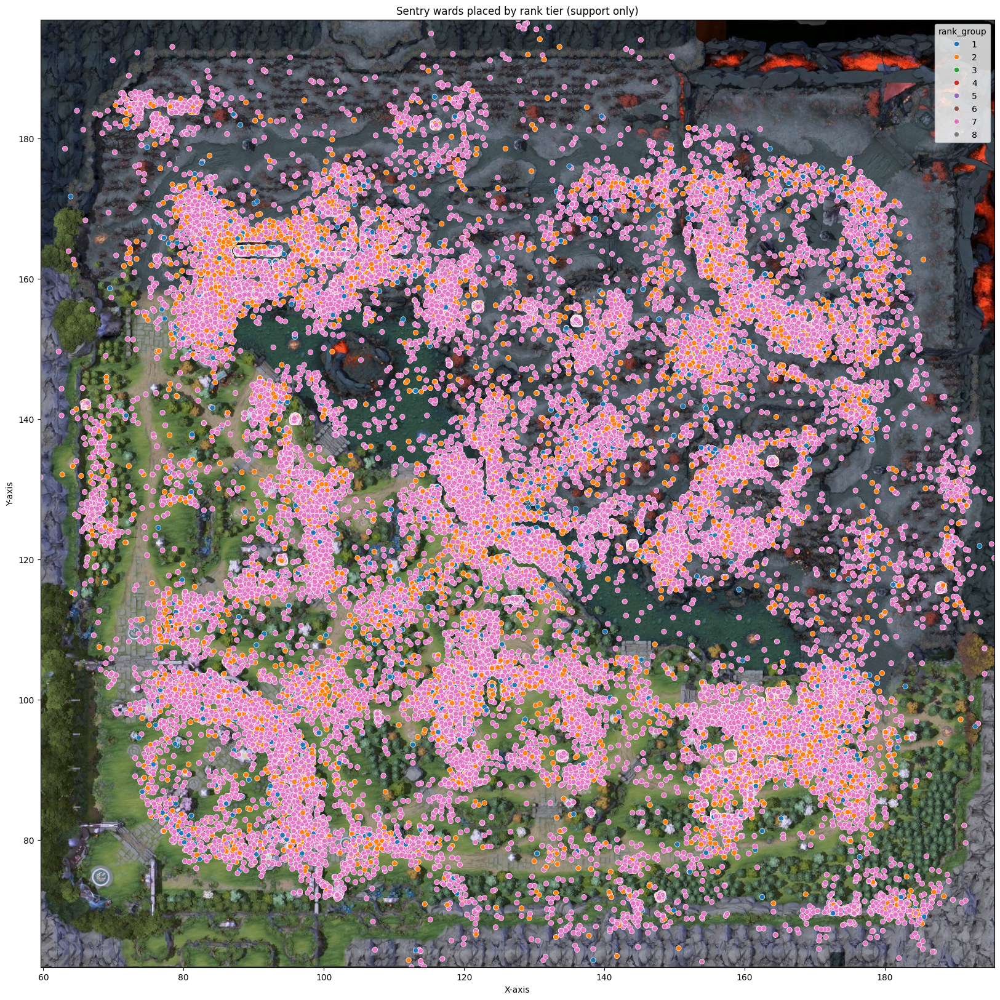

In [13]:
# filter data
support_hero_ids = get_hero_ids_of_role(Role.SUPPORT)

# only consider higher rank supports
coords_sen_support = coords[(coords["hero_id"].isin(support_hero_ids)) & (coords["rank_group"].isin([1, 2, 7])) & (coords["type"] == "sen_log")]
# coords_8 = coords[coords["rank_group"] == 8]

# create map scatter
dota_map = Image.open(os.path.join("..", "resources", "dota_map.jpg"))

fig, ax = plt.subplots(figsize=(20, 20))

# Image credits: https://washingtondccitymapminecraft.github.io/new-zprcp-the-battleground-of-legends-a-comprehensive-guide-to-the-dota-2-map-rmilp-pics/
ax.imshow(dota_map, extent=[min(coords_sen_support['x']), max(coords_sen_support['x']), min(coords_sen_support['y']), max(coords_sen_support['y'])], aspect='auto')

sns.scatterplot(x='x', y='y', hue='rank_group', data=coords_sen_support, ax=ax)

ax.set_title('Sentry wards placed by rank tier (support only)')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

plt.show()